In [1]:
%matplotlib inline

In [1]:
from torchvision import transforms as T
from PIL import Image
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
import os
import torch
import matplotlib as mpl

# Normalize(mean=[0.485, 0.456, 0.406], # statistics from ImageNet
#                                                          std=[0.229, 0.224, 0.225]),

In [2]:
import torch
from torchvision.transforms.functional import rotate


class DiscreteRotation:
    """Rotate image by one of the given angles.

    Arguments:
        angles: list(ints). List of integer degrees to pick from. E.g. [0, 90, 180, 270] for a random 90-degree-like rotation
    """

    def __init__(self, angles):
        self.angles = angles

    def __call__(self, x):
        angle = self.angles[torch.randperm(len(self.angles))[0]]
        return rotate(x, angle)


In [3]:
mpl.rcParams['figure.figsize'] = (10, 5)

In [26]:
torch.manual_seed(0)
# DATA_PATH = "data/breakhis_sample"

# img_name = "SOB_M_DC-14-10926-400-005"
# img_path = os.path.join(DATA_PATH, f"{img_name}.png")
# orig_img = Image.open(img_path)

import h5py
from PIL import Image

imgs_path = os.path.join('D:/Blazej/Dokumenty/AI MSc/Thesis/thesis/rissl/data/pcam', f'camelyonpatch_level_2_split_valid_x.h5')
orig_img = h5py.File(imgs_path, 'r')["x"][0]
orig_img = Image.fromarray(orig_img)

In [27]:
def get_class_name(instance):
    """
    Return name of the class of a given instance.
    """
    return type(instance).__name__

In [30]:
def plot_transforms(transforms, orig_img):
    """
    Given a list of transformations, plot how the image looks like after every step.
    """
    transformed_img = orig_img
#     print("Transform: Original")
#     print("Type:", type(transformed_img))
#     print("Shape:", np.asarray(transformed_img).shape)
    plt.title("Original image")
    plt.imshow(np.asarray(orig_img))
    plt.show()
    
    for t in transforms.transforms:
        transform_name = get_class_name(t)
        transformed_img = t(transformed_img)
        
    print("Transform:", transform_name)
    print("Type:", type(transformed_img))
    print("Shape:", np.asarray(transformed_img).shape)
    print(np.asarray(transformed_img)[0][:2,:2])
    plt.title(transform_name)
    final_img = np.asarray(transformed_img.permute(1,2,0) 
                           if transform_name in ["ToTensor", "Normalize","DiscreteRotation"] else transformed_img)
    plt.imshow(final_img)
    plt.imsave(f'tranform_{t}.png', final_img)
    plt.show()

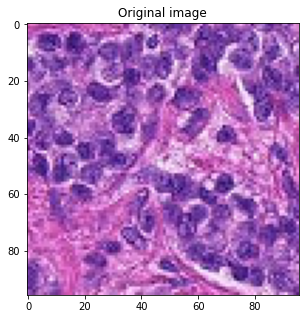

Transform: CenterCrop
Type: <class 'PIL.Image.Image'>
Shape: (224, 224, 3)
[[84 39]
 [82 41]]


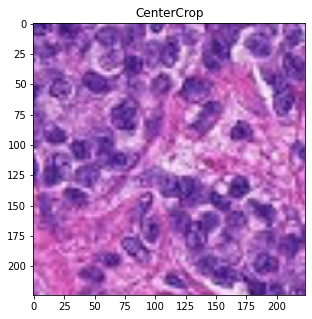

In [31]:
transforms = T.Compose([T.Resize(256),
                        T.CenterCrop(224)
                       ])

plot_transforms(transforms, orig_img)

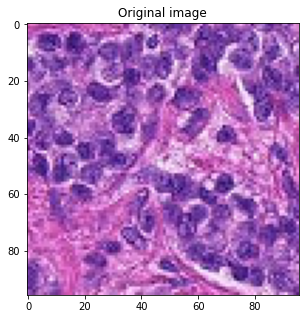

Transform: RandomResizedCrop
Type: <class 'PIL.Image.Image'>
Shape: (224, 224, 3)
[[146  92]
 [146  92]]


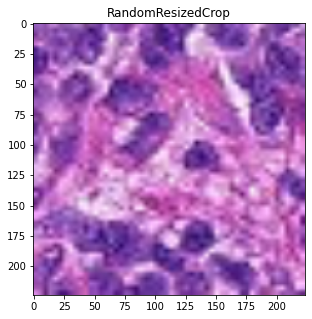

In [63]:
transforms = T.Compose([T.RandomResizedCrop(224)])

plot_transforms(transforms, orig_img)

In [65]:
pcam_img_width=pcam_img_height=96
transforms = T.Compose([T.CenterCrop(400),
                        T.RandomHorizontalFlip(p=0.5),
                        T.RandomVerticalFlip(p=0.5),
                        T.ColorJitter(brightness=64/255,
                                               saturation=0.25,
                                               hue=0.04,
                                               contrast=0.75),
                        T.RandomAffine(degrees=0, translate=(4/pcam_img_width, 4/pcam_img_height)), #  8px jitter following Liu et al 2017
                        T.ToTensor(),
                        T.Normalize(mean=[0.485, 0.456, 0.406], # statistics from ImageNet
                                    std=[0.229, 0.224, 0.225]),
                        DiscreteRotation(angles=[45]),
                       ])

In [66]:
norm = T.Normalize(mean=[0.485, 0.456, 0.406], # statistics from ImageNet
                   std=[0.229, 0.224, 0.225])
rot = DiscreteRotation(angles=[45])
t = torch.ones((3,4,4))
t[:,1:3,1:3] = 0.485

In [67]:
t

tensor([[[1.0000, 1.0000, 1.0000, 1.0000],
         [1.0000, 0.4850, 0.4850, 1.0000],
         [1.0000, 0.4850, 0.4850, 1.0000],
         [1.0000, 1.0000, 1.0000, 1.0000]],

        [[1.0000, 1.0000, 1.0000, 1.0000],
         [1.0000, 0.4850, 0.4850, 1.0000],
         [1.0000, 0.4850, 0.4850, 1.0000],
         [1.0000, 1.0000, 1.0000, 1.0000]],

        [[1.0000, 1.0000, 1.0000, 1.0000],
         [1.0000, 0.4850, 0.4850, 1.0000],
         [1.0000, 0.4850, 0.4850, 1.0000],
         [1.0000, 1.0000, 1.0000, 1.0000]]])

In [59]:
# possibly incorrect
n = rot(norm(t)); n

tensor([[[0.0000, 2.2489, 2.2489, 0.0000],
         [2.2489, 0.0000, 0.0000, 2.2489],
         [2.2489, 0.0000, 0.0000, 2.2489],
         [0.0000, 2.2489, 2.2489, 0.0000]],

        [[0.0000, 2.4286, 2.4286, 0.0000],
         [2.4286, 0.1295, 0.1295, 2.4286],
         [2.4286, 0.1295, 0.1295, 2.4286],
         [0.0000, 2.4286, 2.4286, 0.0000]],

        [[0.0000, 2.6400, 2.6400, 0.0000],
         [2.6400, 0.3511, 0.3511, 2.6400],
         [2.6400, 0.3511, 0.3511, 2.6400],
         [0.0000, 2.6400, 2.6400, 0.0000]]])

In [62]:
# correct
r = norm(rot(t)); r

tensor([[[-2.1179,  2.2489,  2.2489, -2.1179],
         [ 2.2489,  0.0000,  0.0000,  2.2489],
         [ 2.2489,  0.0000,  0.0000,  2.2489],
         [-2.1179,  2.2489,  2.2489, -2.1179]],

        [[-2.0357,  2.4286,  2.4286, -2.0357],
         [ 2.4286,  0.1295,  0.1295,  2.4286],
         [ 2.4286,  0.1295,  0.1295,  2.4286],
         [-2.0357,  2.4286,  2.4286, -2.0357]],

        [[-1.8044,  2.6400,  2.6400, -1.8044],
         [ 2.6400,  0.3511,  0.3511,  2.6400],
         [ 2.6400,  0.3511,  0.3511,  2.6400],
         [-1.8044,  2.6400,  2.6400, -1.8044]]])

Transform: Original
Type: <class 'PIL.PngImagePlugin.PngImageFile'>
Shape: (460, 700, 3)


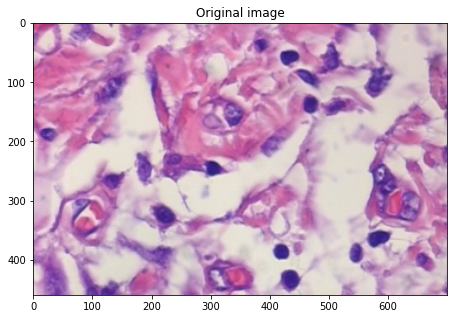

Transform: CenterCrop
Type: <class 'PIL.Image.Image'>
Shape: (400, 400, 3)
[[202 154]
 [203 151]]


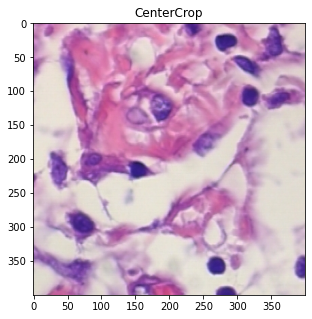

Transform: RandomHorizontalFlip
Type: <class 'PIL.Image.Image'>
Shape: (400, 400, 3)
[[202 154]
 [203 151]]


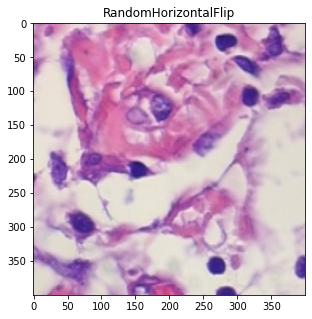

Transform: RandomVerticalFlip
Type: <class 'PIL.Image.Image'>
Shape: (400, 400, 3)
[[202 154]
 [203 151]]


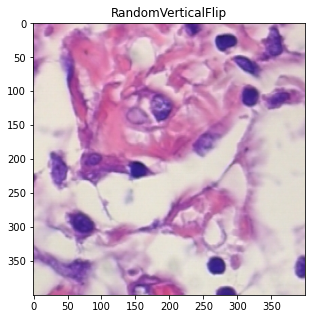

Transform: ColorJitter
Type: <class 'PIL.Image.Image'>
Shape: (400, 400, 3)
[[196 146]
 [197 143]]


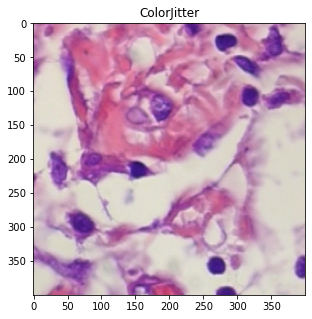

Transform: RandomAffine
Type: <class 'PIL.Image.Image'>
Shape: (400, 400, 3)
[[215 146]
 [214 143]]


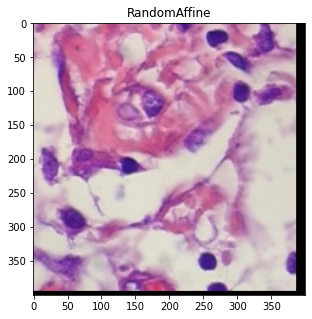

Transform: ToTensor
Type: <class 'torch.Tensor'>
Shape: (3, 400, 400)
[[0.84313726 0.8392157 ]
 [0.8352941  0.827451  ]]


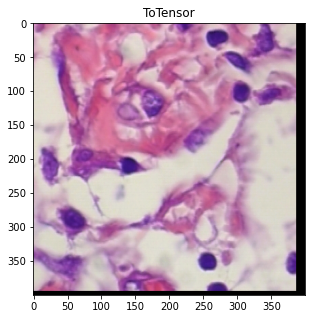

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Transform: Normalize
Type: <class 'torch.Tensor'>
Shape: (3, 400, 400)
[[1.5639181 1.5467933]
 [1.5296686 1.4954191]]


ValueError: Floating point image RGB values must be in the 0..1 range.

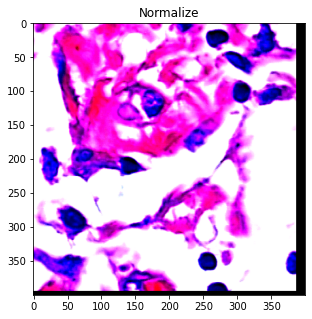

In [68]:
plot_transforms(transforms, orig_img)

## ResizeCrop vs Crop
Clearly, without resizing, the image is strongly magnified and preserve a very small part of the original image.

Transform: Original
Type: <class 'PIL.PngImagePlugin.PngImageFile'>
Shape: (460, 700, 3)


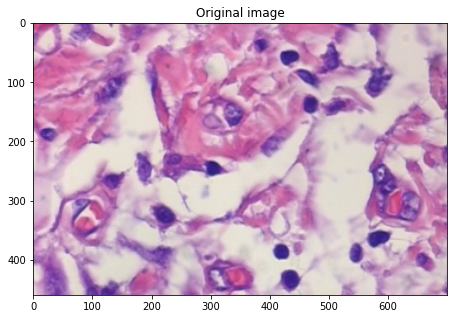

Transform: DiscreteRotation
Type: <class 'PIL.Image.Image'>
Shape: (460, 700, 3)


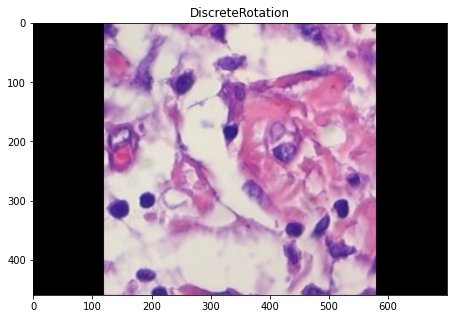

Transform: Original
Type: <class 'PIL.PngImagePlugin.PngImageFile'>
Shape: (460, 700, 3)


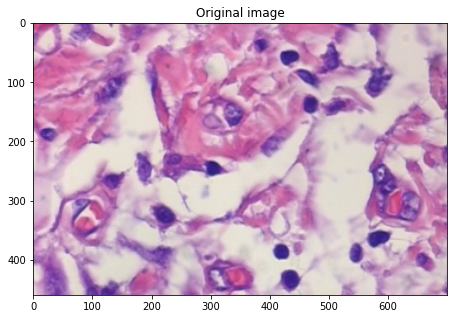

Transform: DiscreteRotation
Type: <class 'PIL.Image.Image'>
Shape: (460, 700, 3)


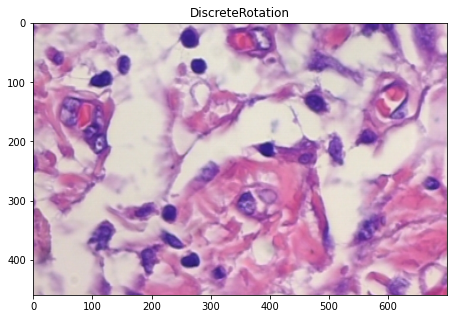

Transform: Original
Type: <class 'PIL.PngImagePlugin.PngImageFile'>
Shape: (460, 700, 3)


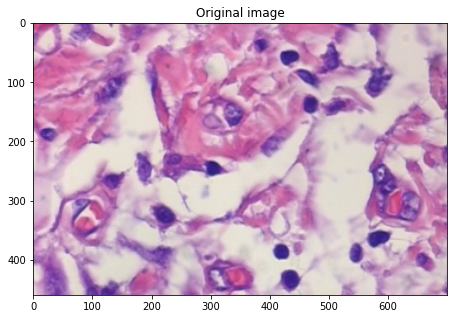

Transform: DiscreteRotation
Type: <class 'PIL.Image.Image'>
Shape: (460, 700, 3)


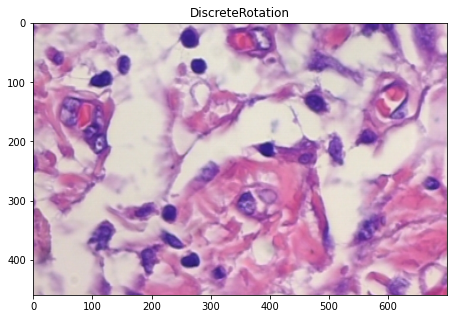

Transform: Original
Type: <class 'PIL.PngImagePlugin.PngImageFile'>
Shape: (460, 700, 3)


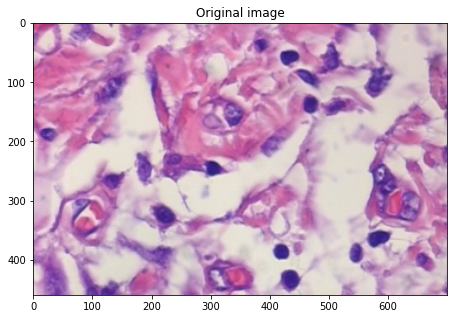

Transform: DiscreteRotation
Type: <class 'PIL.Image.Image'>
Shape: (460, 700, 3)


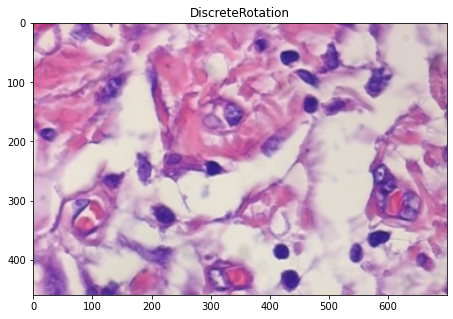

Transform: Original
Type: <class 'PIL.PngImagePlugin.PngImageFile'>
Shape: (460, 700, 3)


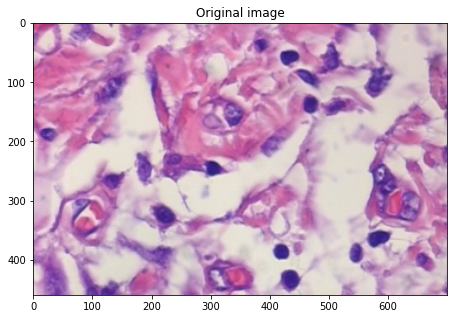

Transform: DiscreteRotation
Type: <class 'PIL.Image.Image'>
Shape: (460, 700, 3)


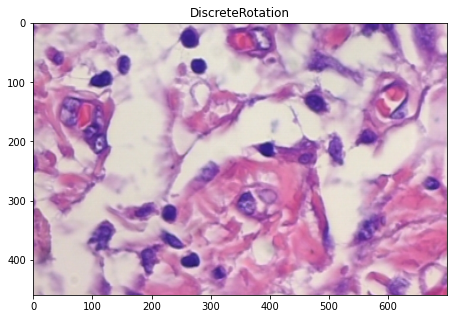

In [13]:
resize_crop = T.Compose([DiscreteRotation(angles=[0, 90, 180, 270])])
for _ in range(5):
    plot_transforms(resize_crop, orig_img)

Transform: Original
Type: <class 'PIL.PngImagePlugin.PngImageFile'>
Shape: (460, 700, 3)


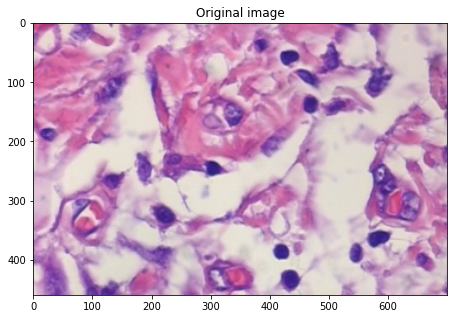

Transform: CenterCrop
Type: <class 'PIL.Image.Image'>
Shape: (224, 224, 3)


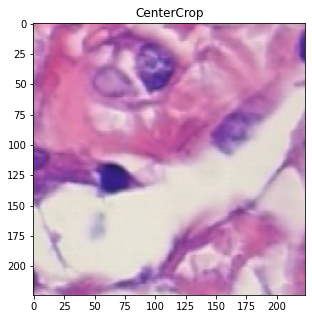

In [175]:
center_crop_only = T.Compose([T.CenterCrop(224)])
plot_transforms(center_crop_only, orig_img)

Without resizing, larger cropping preserves more "field of view".

Transform: Original
Type: <class 'PIL.PngImagePlugin.PngImageFile'>
Shape: (460, 700, 3)


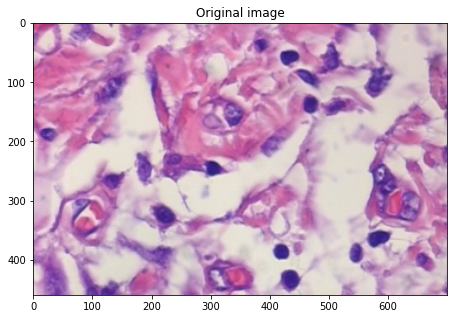

Transform: CenterCrop
Type: <class 'PIL.Image.Image'>
Shape: (400, 400, 3)


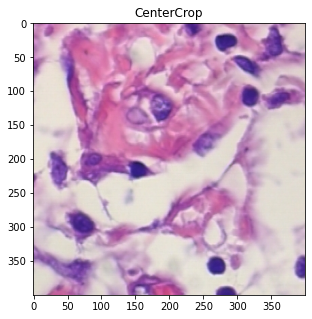

In [12]:
center_crop_only = T.Compose([T.CenterCrop(400)])
plot_transforms(center_crop_only, orig_img)

## Effect of resizing

In [29]:
mpl.rcParams['figure.figsize'] = [6, 3] 

Transform: Original
Type: <class 'PIL.PngImagePlugin.PngImageFile'>
Shape: (460, 700, 3)


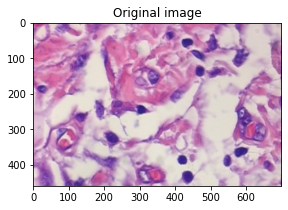

Transform: Resize
Type: <class 'PIL.Image.Image'>
Shape: (256, 389, 3)


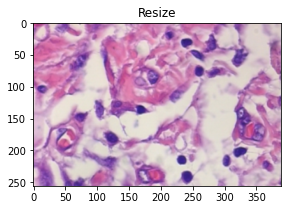

In [30]:
resize_crop = T.Compose([T.Resize(256)])
plot_transforms(resize_crop, orig_img)

Transform: Original
Type: <class 'PIL.PngImagePlugin.PngImageFile'>
Shape: (460, 700, 3)


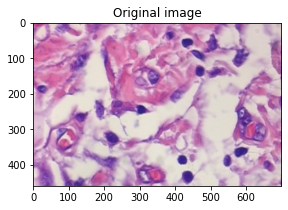

Transform: Resize
Type: <class 'PIL.Image.Image'>
Shape: (40, 60, 3)


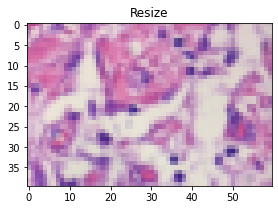

In [31]:
resize_crop = T.Compose([T.Resize(40)])
plot_transforms(resize_crop, orig_img)

## Inspecting all images of a patient

In [15]:
def plot(imgs, **imshow_kwargs):
    """
    Plot multiple images in subplot
    """

    num_rows = len(imgs) // 4
    num_cols = 4
    fig, axs = plt.subplots(nrows=num_rows, ncols=num_cols, squeeze=False)
    img_idx = 0
    for row_idx in range(num_rows):
        for col_idx in range(num_cols):
            if img_idx < len(imgs):
                ax = axs[row_idx, col_idx]
                try:
                    img, img_name = imgs[img_idx]
                except:
                    print(img_idx)
                ax.imshow(np.asarray(img), **imshow_kwargs)
                ax.set(xticklabels=[], yticklabels=[], xticks=[], yticks=[], title=img_name)
                img_idx += 1
    plt.tight_layout()

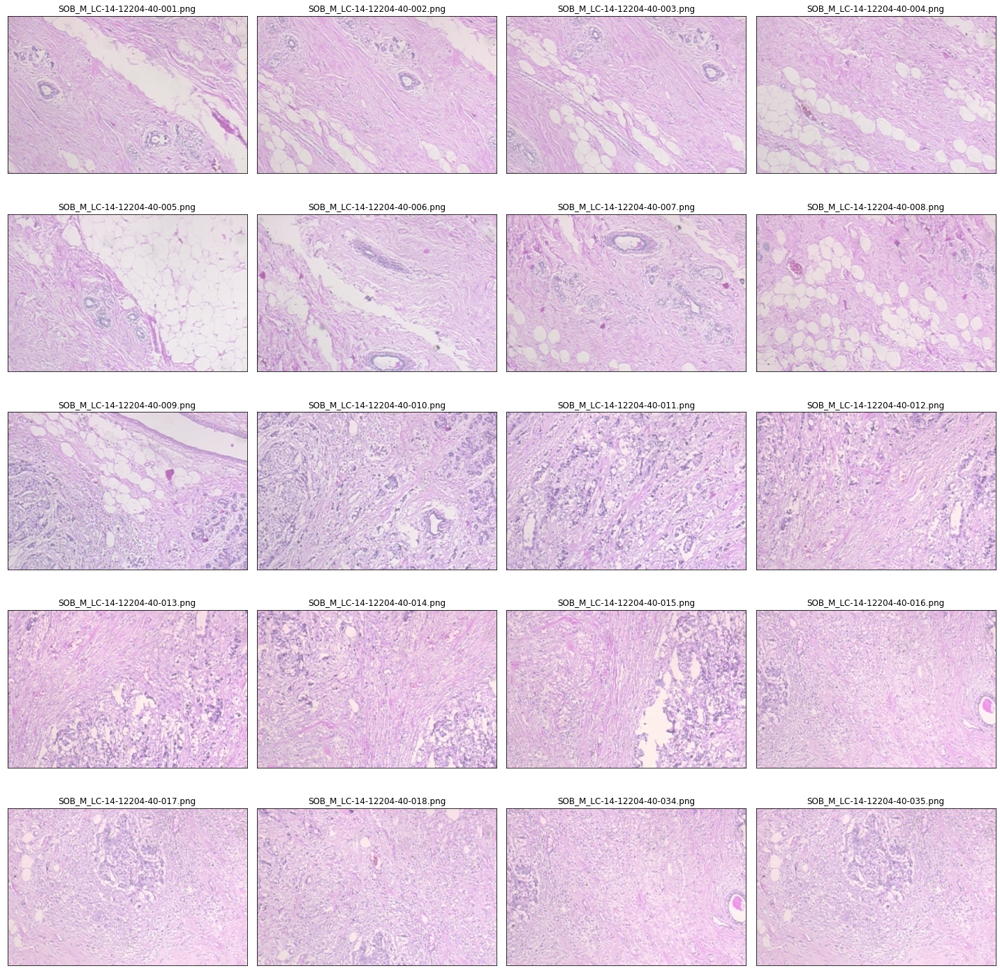

In [32]:
# default figsize
mpl.rcParams['figure.figsize'] = [20, 20] 

patient_path = "data/breakhis_sample/SOB_M_LC_14-12204"
mag="40X"
imgs_path = os.path.join(patient_path, mag)
imgs = [(Image.open(os.path.join(imgs_path, img_name)), img_name) for img_name in os.listdir(imgs_path)]
plot(imgs)

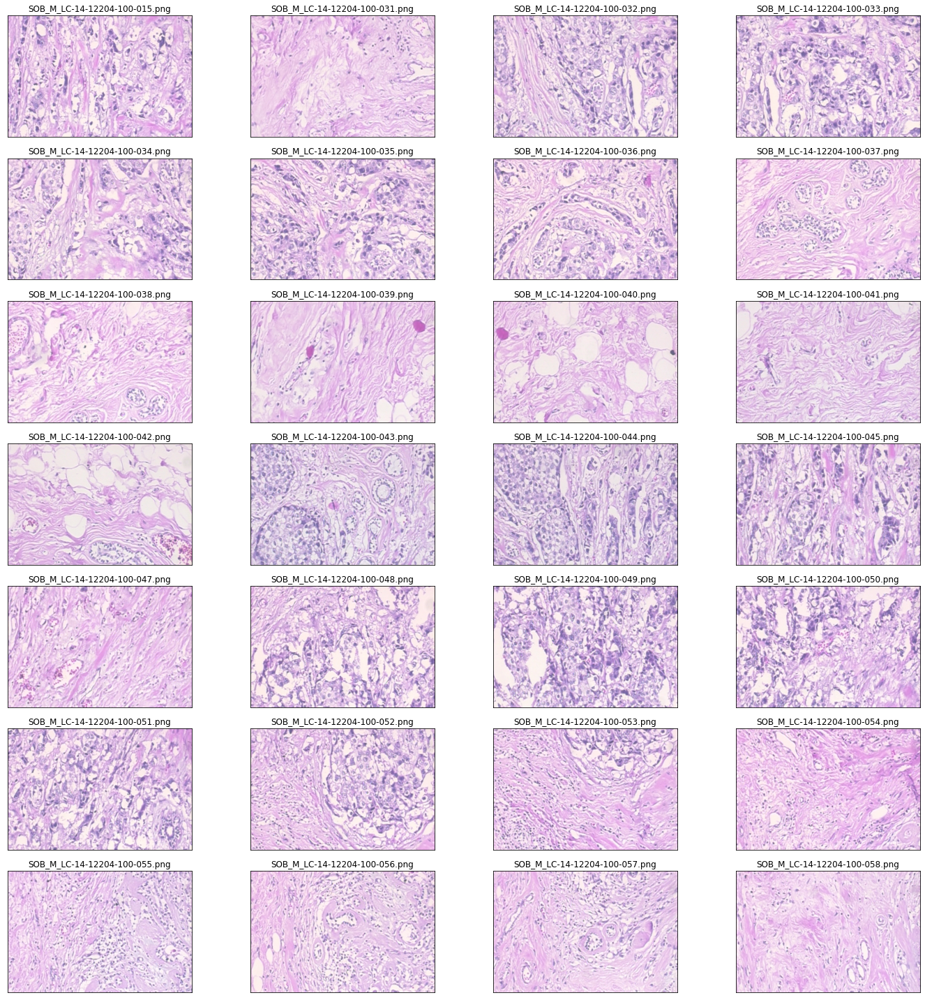

In [33]:
# default figsize
mpl.rcParams['figure.figsize'] = [20, 20] 

patient_path = "data/breakhis_sample/SOB_M_LC_14-12204"
mag="100X"
imgs_path = os.path.join(patient_path, mag)
imgs = [(Image.open(os.path.join(imgs_path, img_name)), img_name) for img_name in os.listdir(imgs_path)]
plot(imgs)